# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
from collections import defaultdict
from wordcloud import WordCloud
from IPython.display import Markdown, display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from bs4 import BeautifulSoup
import itertools

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#os.chdir(r'C:\Users\Bazinga\AAIC\Assignments\AmazonDBSqlite')
os.chdir(r'/content/drive/My Drive/AI/AmazonDBSqlite/')

In [4]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 10000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (10000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [5]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [6]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [7]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [8]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [9]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [10]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [11]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(9564, 10)

In [12]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

95.64

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [13]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [14]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [15]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(9564, 10)


1    7976
0    1588
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [16]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [17]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stop_words= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [18]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stop_words)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 9564/9564 [00:04<00:00, 2320.56it/s]


In [19]:
preprocessed_reviews[400]

'dog loved think probably helped gas dare say breath'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [20]:
## Similartly you can do preprocessing for review summary also.
from tqdm import tqdm
preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stop_words)
    preprocessed_summary.append(sentance.strip())

100%|██████████| 9564/9564 [00:04<00:00, 2338.63it/s]


In [21]:
preprocessed_summary[50]

'pico pica best'

In [22]:
preprocessed_combinedText=[]
for i in range(0, len(preprocessed_reviews)):
    preprocessed_combinedText.append(preprocessed_reviews[i]+ ' ' + preprocessed_summary[i])

In [23]:
print(len(preprocessed_reviews))
print(len(preprocessed_summary))
print(len(preprocessed_combinedText))

9564
9564
9564


In [24]:
final['CleanedText']=preprocessed_combinedText
final.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text',
       'CleanedText'],
      dtype='object')

In [25]:
final['Text'].shape

(9564,)

In [26]:
#Sorting based on Time
final['Time'] = pd.to_datetime(final['Time'], origin='unix', unit='s')
final = final.sort_values('Time')
print(final.shape)
print(final['Time'].head(1000))

(9564, 11)
1146   2000-06-23
1145   2000-06-29
7427   2004-01-30
3481   2004-04-10
6790   2004-05-02
          ...    
4230   2008-11-17
512    2008-11-17
6846   2008-11-18
5853   2008-11-18
1189   2008-11-22
Name: Time, Length: 1000, dtype: datetime64[ns]


# [4] Featurization

## [4.1] BAG OF WORDS

In [27]:
#Compute BoW
from sklearn.preprocessing import normalize
countVector=CountVectorizer(min_df=5, max_features=5000)
bowData=countVector.fit_transform(final['CleanedText'])

print('Shape of bowData is: ', bowData.shape)

#Normalize data
bowData=normalize(X=bowData, axis=1, norm='l2')

Shape of bowData is:  (9564, 5000)


## [4.3] TF-IDF

In [28]:
#Compute tfidf
tfidfVector = TfidfVectorizer(ngram_range=(1,2), min_df=5, max_features=500)
tfidfData=tfidfVector.fit_transform(final['CleanedText'])
print('Shape of ifidfData is: ', tfidfData.shape)

#Normalize tfidf vectors
tfidf_train=normalize(tfidfData)


Shape of ifidfData is:  (9564, 500)


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [29]:
list_of_sentance=[]
for sentance in final['CleanedText']:
    list_of_sentance.append(sentance.split())
w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
w2v_words = list(w2v_model.wv.index2word)

sent_vectors = []; 
for sent in tqdm(list_of_sentance):
    sent_vec = np.zeros(50) 
    cnt_words =0;
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

#Normalizing Avg w2v vectors
avgw2vData=normalize(sent_vectors)

100%|██████████| 9564/9564 [00:10<00:00, 917.22it/s]

9564
50


#### [4.4.1.2] TFIDF weighted W2v

In [30]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2),min_df=10,max_features=500)

tf_idf_matrix=tf_idf_vect.fit_transform(final['CleanedText'])
tfidf_feat = tf_idf_vect.get_feature_names() 
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))

#TFIDF weighted W2V for cleaned text data
tfidf_sent_vectors = []
row=0;
for sent in tqdm(list_of_sentance): 
    sent_vec = np.zeros(50)
    weight_sum =0;
    for word in sent: 
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1
    
    #normalize TF-IDF weighted Word2Vec 
tfidfw2vData=normalize(tfidf_sent_vectors)

100%|██████████| 9564/9564 [00:15<00:00, 637.22it/s]


# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

## [5.1] K-Means Clustering

In [31]:
def displayWordCould(df):
    wordCloud = WordCloud(collocations = False, 
                          stopwords=[''],
                          background_color = 'white')\
                         .generate(' '.join(map(str, df)))

    #Display the generated Word Cloud
    plt.figure(figsize=(8,8))
    plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis("off")
    plt.show('\n')

In [32]:
def printNumberOfWordsinCluster(labels, reviews):

    s=list(zip(labels, reviews))
    reviewwithLables=defaultdict(list)

    #Appeding corresponding words to their clusters
    for label, review in s:
        reviewwithLables[label].append(review)
        
    for i in sorted(reviewwithLables.keys()):
        print('Number of reviews in cluster {}: {}'.format(i, len(reviewwithLables[i])))
        #print('Number of words in cluster {}: {}'.format(i, len(list(itertools.chain(*reviewwithLables[i])))))
        displayWordCould(reviewwithLables[i])

In [33]:
def findOptimulkMeansParameters(init, data):
    #init=random
    inertia=list()
    for i in range(1, 15):
        kmeans=KMeans(n_clusters=i, init=init, random_state=42, verbose=0)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)

    plt.plot(range(1, len(inertia)+1), np.log10(inertia))
    plt.title('initialization- {}'.format(init))
    plt.xlabel('n_clusters')
    plt.ylabel('log_intertia')
    plt.ticklabel_format(axis='both', style='plain')
    plt.show()

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

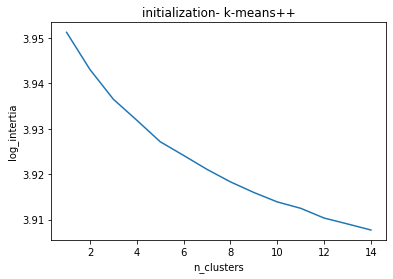

In [34]:
findOptimulkMeansParameters('k-means++', bowData)

In [35]:
#initialization as 'k-means++' and taking considering optimum clusters as 8
optimumClusters=5
kmeansKplusplus=KMeans(n_clusters=optimumClusters, init='k-means++',random_state=42, verbose=0)
kmeansKplusplus.fit(bowData)

print('Optimum number of clusters is- {}'.format(optimumClusters))

kmeansKPlusPlusLabels=kmeansKplusplus.labels_

Optimum number of clusters is- 5


### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

Number of reviews in cluster 0: 888


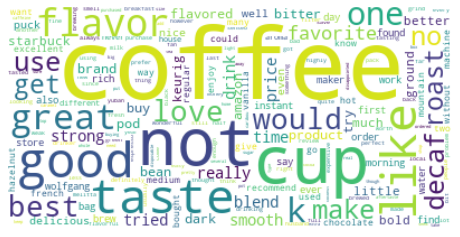

Number of reviews in cluster 1: 1681


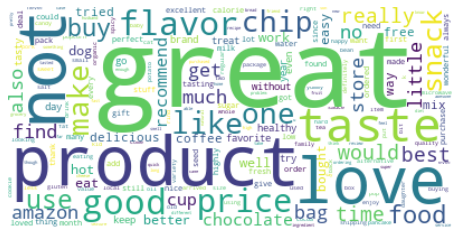

Number of reviews in cluster 2: 3952


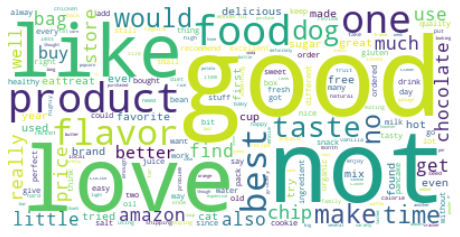

Number of reviews in cluster 3: 426


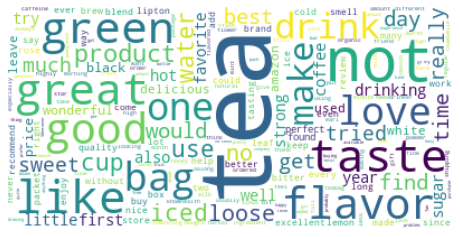

Number of reviews in cluster 4: 2617


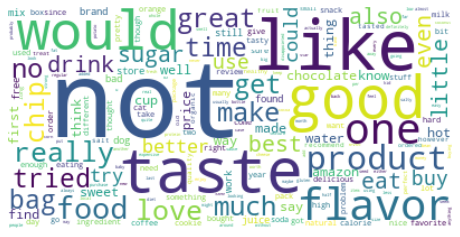

In [36]:
printNumberOfWordsinCluster(kmeansKPlusPlusLabels, final['CleanedText'] )

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

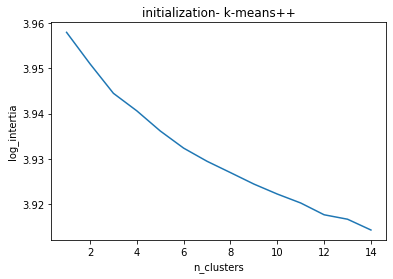

In [37]:
findOptimulkMeansParameters('k-means++', tfidfData)

In [38]:
#initialization as 'k-means++' and taking considering optimum clusters as 5
optimumClusters=5
kmeansKplusplus=KMeans(n_clusters=optimumClusters, init='k-means++',random_state=42, verbose=0)
kmeansKplusplus.fit(tfidfData)

print('Optimum number of clusters is- {}'.format(optimumClusters))

kmeansKPlusPlusLabels=kmeansKplusplus.labels_

Optimum number of clusters is- 5


### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

Number of reviews in cluster 0: 678


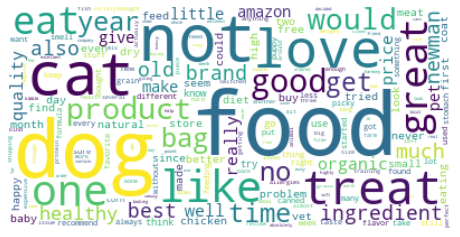

Number of reviews in cluster 1: 6878


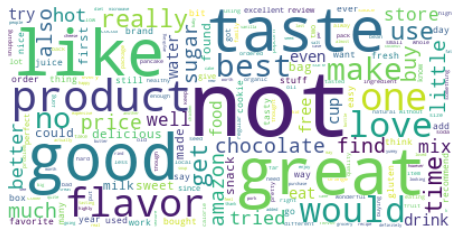

Number of reviews in cluster 2: 1021


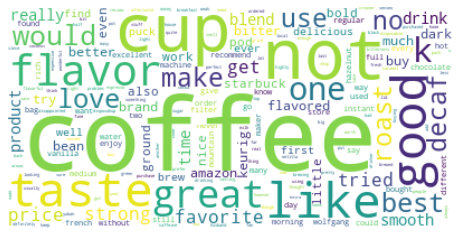

Number of reviews in cluster 3: 512


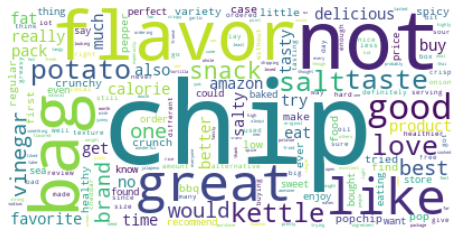

Number of reviews in cluster 4: 475


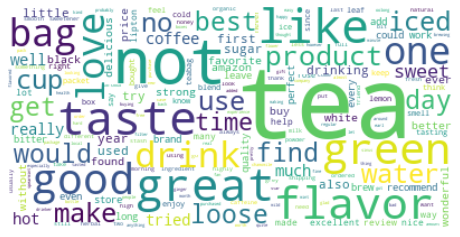

In [39]:
printNumberOfWordsinCluster(kmeansKPlusPlusLabels, final['CleanedText'])

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

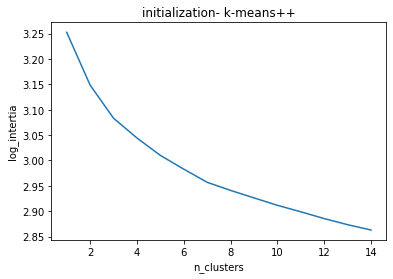

In [40]:
findOptimulkMeansParameters('k-means++', avgw2vData)

In [41]:
#initialization as 'k-means++' and taking considering optimum clusters as 8
optimumClusters=5
kmeansKplusplus=KMeans(n_clusters=optimumClusters, init='k-means++',random_state=42, verbose=0)
kmeansKplusplus.fit(avgw2vData)

print('Optimum number of clusters is- {}'.format(optimumClusters))

kmeansKPlusPlusLabels=kmeansKplusplus.labels_

Optimum number of clusters is- 5


### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

Number of reviews in cluster 0: 1170


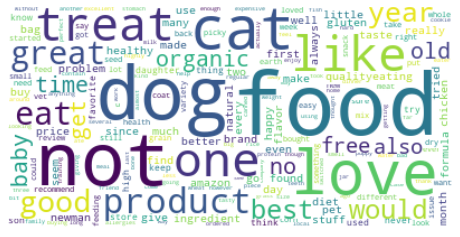

Number of reviews in cluster 1: 1912


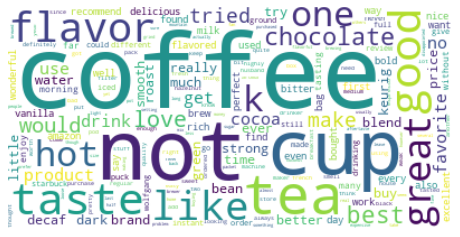

Number of reviews in cluster 2: 2579


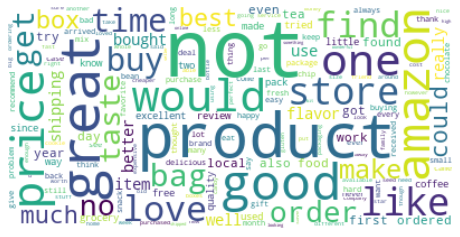

Number of reviews in cluster 3: 2523


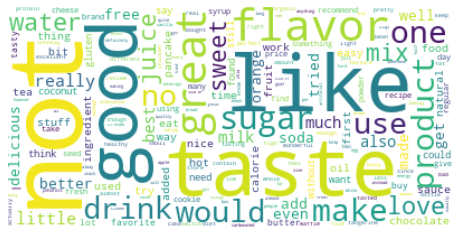

Number of reviews in cluster 4: 1380


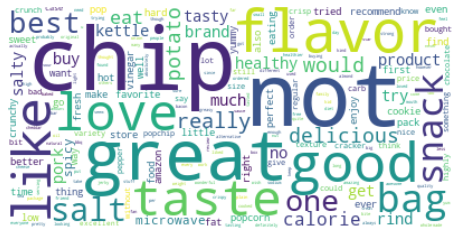

In [42]:
printNumberOfWordsinCluster(kmeansKPlusPlusLabels, final['CleanedText'])

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

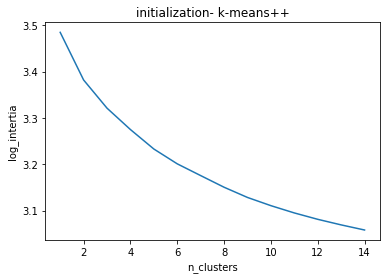

In [43]:
findOptimulkMeansParameters('k-means++', tfidfw2vData)

In [44]:
#initialization as 'k-means++' and taking considering optimum clusters as 8
optimumClusters=5
kmeansKplusplus=KMeans(n_clusters=optimumClusters, init='k-means++',random_state=42, verbose=0)
kmeansKplusplus.fit(tfidfw2vData)

print('Optimum number of clusters is- {}'.format(optimumClusters))

kmeansKPlusPlusLabels=kmeansKplusplus.labels_

Optimum number of clusters is- 5


### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

Number of reviews in cluster 0: 2081


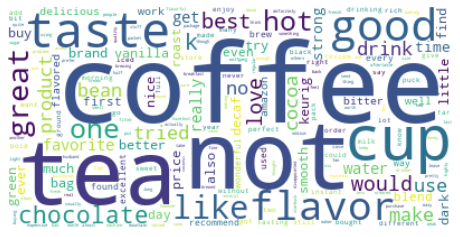

Number of reviews in cluster 1: 2756


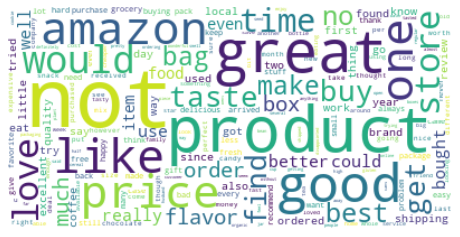

Number of reviews in cluster 2: 984


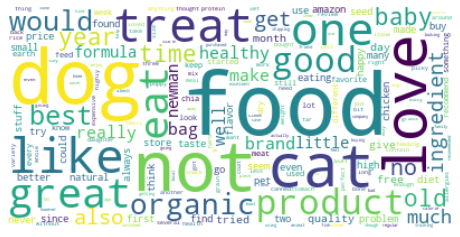

Number of reviews in cluster 3: 1229


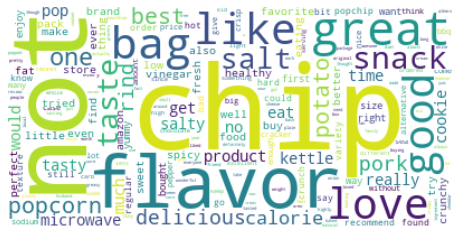

Number of reviews in cluster 4: 2514


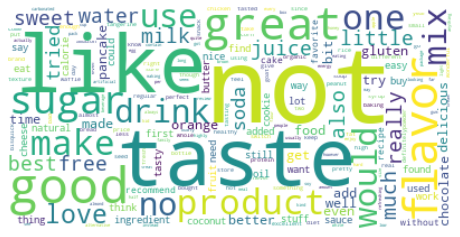

In [45]:
printNumberOfWordsinCluster(kmeansKPlusPlusLabels, final['CleanedText'])

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

   ####   Agglomerative Clustering with cluster size 2

In [46]:
n_clusters=2
aggloModel=AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean')
aggloModel.fit(avgw2vData)
aggloModelAvgw2vLabels=aggloModel.labels_

### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

Number of Clusters: 2
Number of reviews in cluster 0: 4884


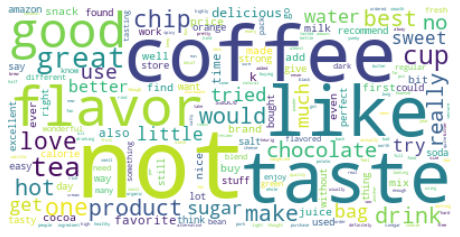

Number of reviews in cluster 1: 4680


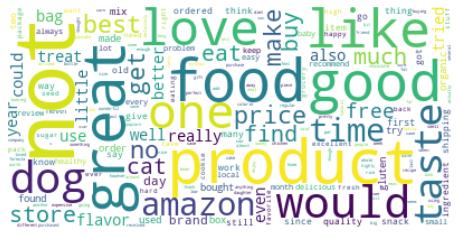

In [47]:
print('Number of Clusters: {}'.format(n_clusters))
printNumberOfWordsinCluster(aggloModelAvgw2vLabels, final['CleanedText'])

#### Agglomerative Clustering with cluster size 5

In [48]:
n_clusters=5
aggloModel=AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean')
aggloModel.fit(avgw2vData)
aggloModelAvgw2vLabels=aggloModel.labels_

Number of Clusters: 5
Number of reviews in cluster 0: 4057


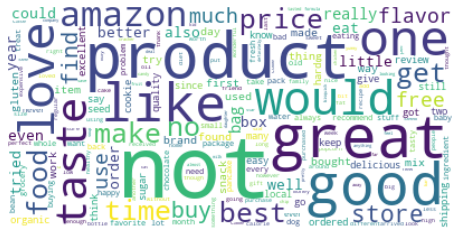

Number of reviews in cluster 1: 2234


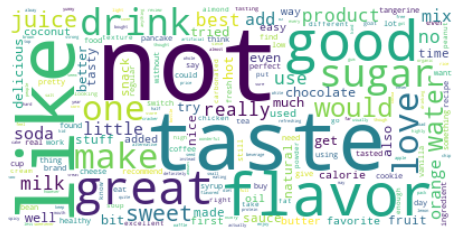

Number of reviews in cluster 2: 2007


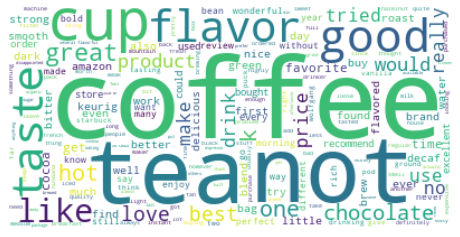

Number of reviews in cluster 3: 623


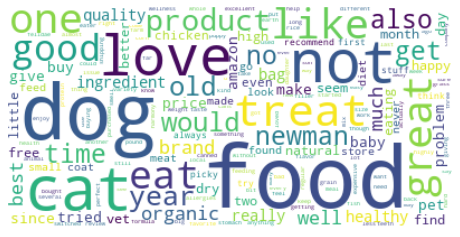

Number of reviews in cluster 4: 643


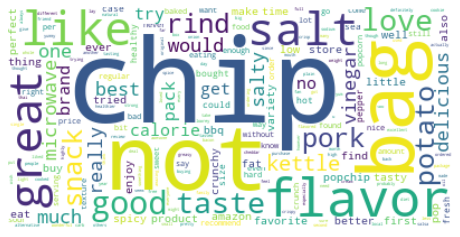

In [49]:
print('Number of Clusters: {}'.format(n_clusters))
printNumberOfWordsinCluster(aggloModelAvgw2vLabels, final['CleanedText'])

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

#### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

   ####   Agglomerative Clustering with cluster size 2

In [50]:
n_clusters=2
aggloModel=AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean')
aggloModel.fit(tfidfw2vData)
aggloModelefidfw2vLabels=aggloModel.labels_

Number of Clusters: 2
Number of reviews in cluster 0: 5005


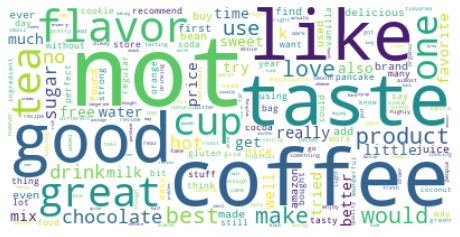

Number of reviews in cluster 1: 4559


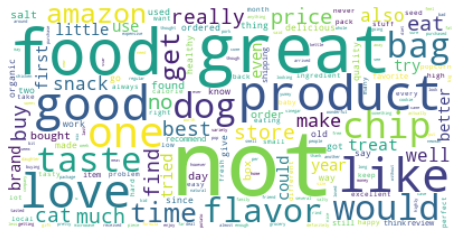

In [51]:
print('Number of Clusters: {}'.format(n_clusters))
printNumberOfWordsinCluster(aggloModelefidfw2vLabels, final['CleanedText'])

   ####   Agglomerative Clustering with cluster size 5

In [52]:
n_clusters=5
aggloModel=AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean')
aggloModel.fit(tfidfw2vData)
aggloModelefidfw2vLabels=aggloModel.labels_

Number of Clusters: 5
Number of reviews in cluster 0: 3454


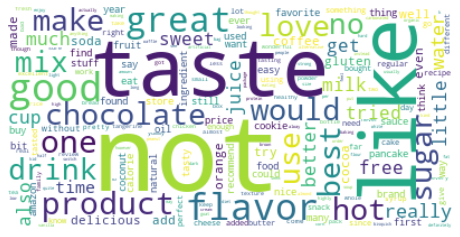

Number of reviews in cluster 1: 2628


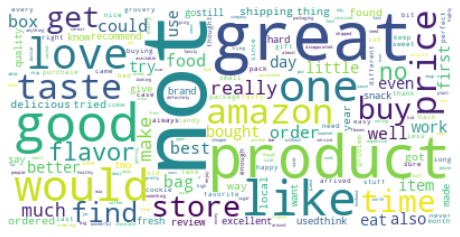

Number of reviews in cluster 2: 1551


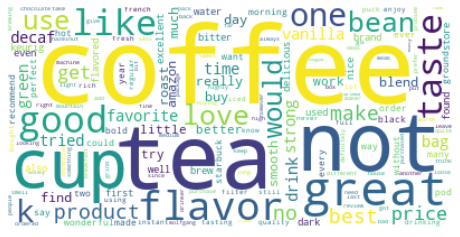

Number of reviews in cluster 3: 1016


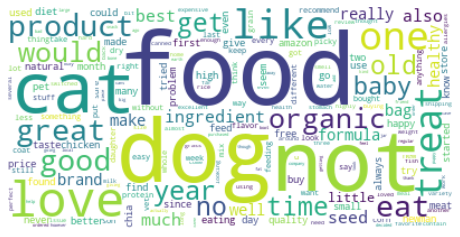

Number of reviews in cluster 4: 915


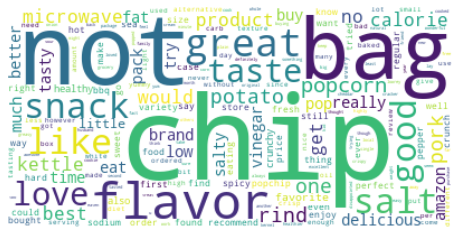

In [53]:
print('Number of Clusters: {}'.format(n_clusters))
printNumberOfWordsinCluster(aggloModelefidfw2vLabels, final['CleanedText'])

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

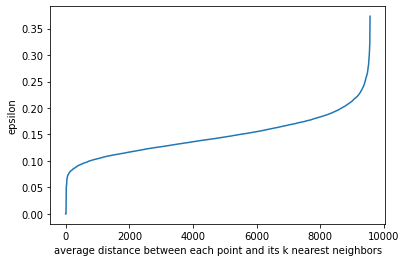

In [54]:
from sklearn.neighbors import NearestNeighbors

min_points=10 
neighbors = NearestNeighbors(n_neighbors=min_points)
neighbors.fit(avgw2vData)

distances, indices = neighbors.kneighbors(avgw2vData)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.xlabel("average distance between each point and its k nearest neighbors")
plt.ylabel("epsilon")
plt.plot(distances)

## a. eps = 0.15


In [55]:
dbscanModelavgw2v=DBSCAN(eps=0.15, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModelavgw2v.fit(avgw2vData)

DBSCAN(eps=0.15, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 6460


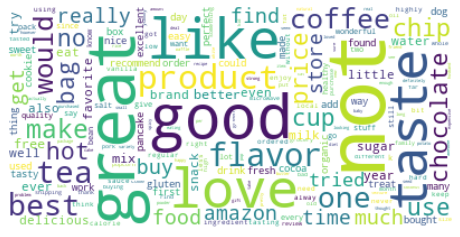

Number of reviews in cluster 0: 2422


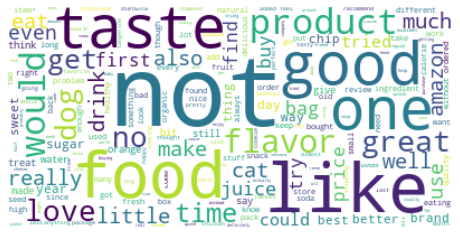

Number of reviews in cluster 1: 612


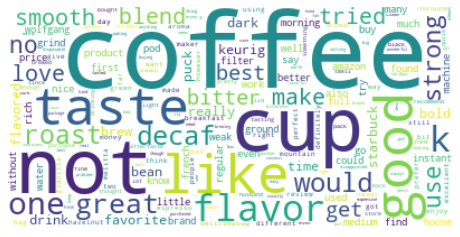

Number of reviews in cluster 2: 29


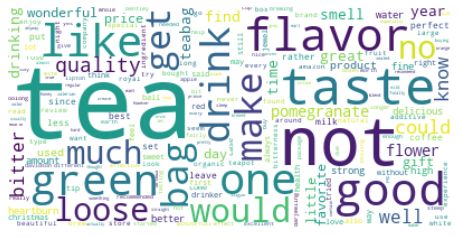

Number of reviews in cluster 3: 14


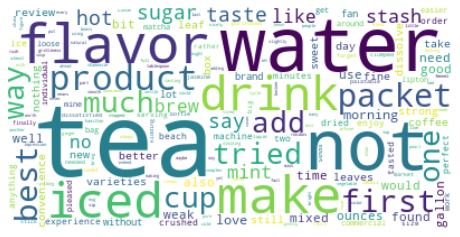

Number of reviews in cluster 4: 7


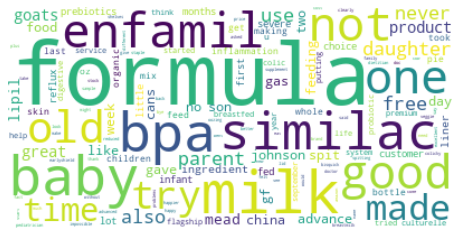

Number of reviews in cluster 5: 10


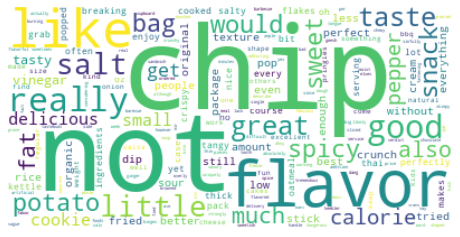

Number of reviews in cluster 6: 10


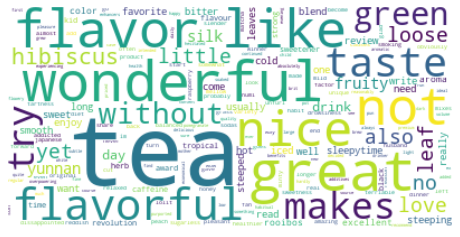

In [56]:
dbscanModelavgw2vLabels=dbscanModelavgw2v.labels_
printNumberOfWordsinCluster(dbscanModelavgw2vLabels, final['CleanedText'])

### b. eps = 0.25

In [57]:
dbscanModelavgw2v=DBSCAN(eps=0.25, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModelavgw2v.fit(avgw2vData)

DBSCAN(eps=0.25, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 244


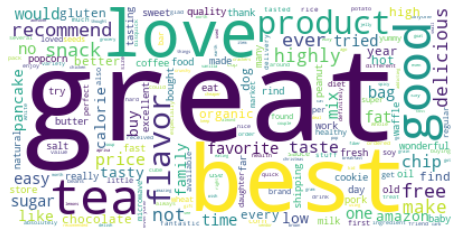

Number of reviews in cluster 0: 9320


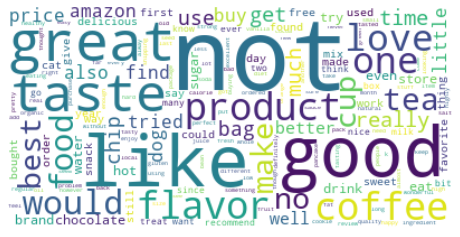

In [58]:
dbscanModelavgw2vLabels=dbscanModelavgw2v.labels_
printNumberOfWordsinCluster(dbscanModelavgw2vLabels, final['CleanedText'])

### c. eps = 0.25

In [59]:
dbscanModeltfidfw2v=DBSCAN(eps=0.25, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModeltfidfw2v.fit(avgw2vData)

DBSCAN(eps=0.25, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 244


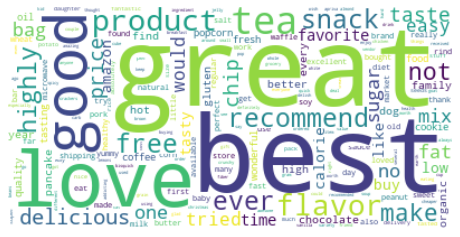

Number of reviews in cluster 0: 9320


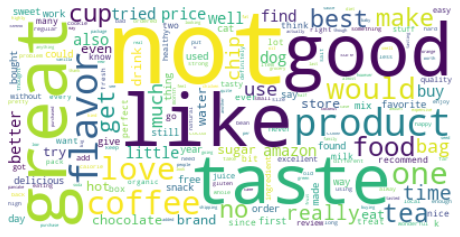

In [60]:
dbscanModeltfidfw2vLabels=dbscanModelavgw2v.labels_
printNumberOfWordsinCluster(dbscanModeltfidfw2vLabels, final['CleanedText'])

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

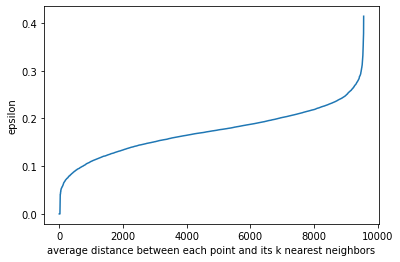

In [61]:
min_points=10 
neighbors = NearestNeighbors(n_neighbors=min_points)
neighbors.fit(tfidfw2vData)

distances, indices = neighbors.kneighbors(tfidfw2vData)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.xlabel("average distance between each point and its k nearest neighbors")
plt.ylabel("epsilon")
plt.plot(distances)

### a. eps = 0.25

In [62]:
dbscanModeltfidfw2v=DBSCAN(eps=0.25, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModeltfidfw2v.fit(tfidfw2vData)

DBSCAN(eps=0.25, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 1241


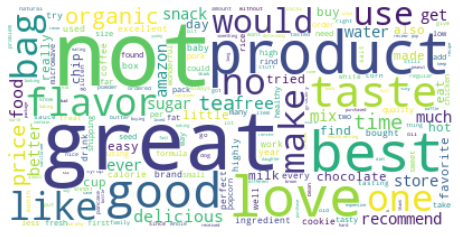

Number of reviews in cluster 0: 8311


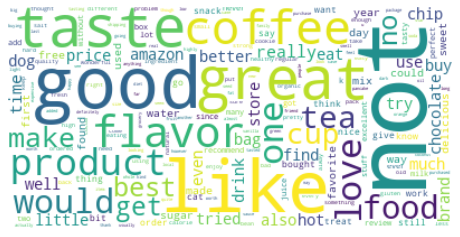

Number of reviews in cluster 1: 4


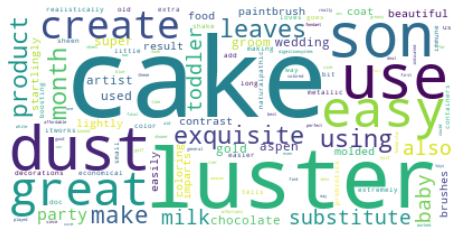

Number of reviews in cluster 2: 8


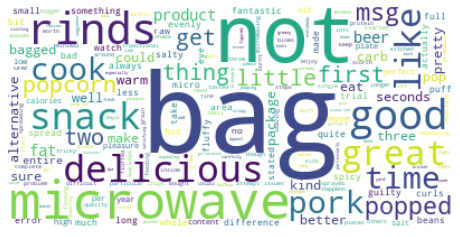

In [63]:
dbscanModeltfidfw2vLabels=dbscanModeltfidfw2v.labels_
printNumberOfWordsinCluster(dbscanModeltfidfw2vLabels, final['CleanedText'])

## b. eps = 0.3

In [64]:
dbscanModeltfidfw2v=DBSCAN(eps=0.3, min_samples=10, metric='euclidean', n_jobs=-1)
dbscan=dbscanModeltfidfw2v.fit(tfidfw2vData)

Number of reviews in cluster -1: 139


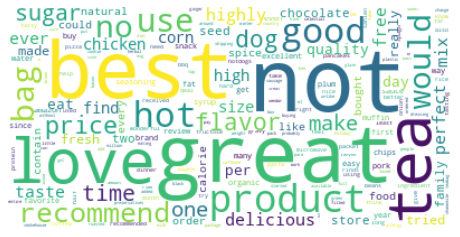

Number of reviews in cluster 0: 9425


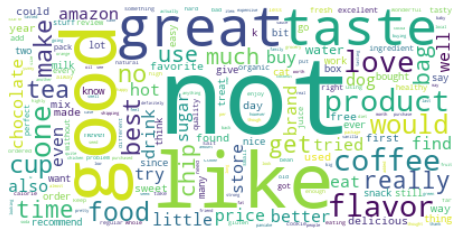

In [65]:
dbscanModeltfidfw2vLabels=dbscanModeltfidfw2v.labels_
printNumberOfWordsinCluster(dbscanModeltfidfw2vLabels, final['CleanedText'])

### c. eps = 0.35

In [66]:
dbscanModeltfidfw2v=DBSCAN(eps=0.35, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModeltfidfw2v.fit(tfidfw2vData)

DBSCAN(eps=0.35, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 24


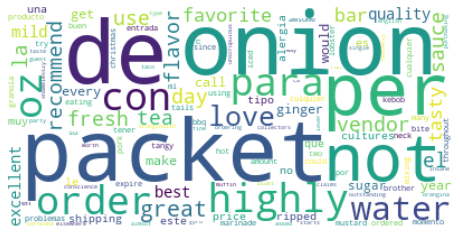

Number of reviews in cluster 0: 9540


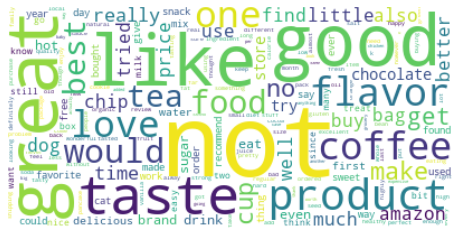

In [67]:
dbscanModeltfidfw2vLabels=dbscanModeltfidfw2v.labels_
printNumberOfWordsinCluster(dbscanModeltfidfw2vLabels, final['CleanedText'])

### d. eps = 0.4

In [68]:
dbscanModeltfidfw2v=DBSCAN(eps=0.35, min_samples=10, metric='euclidean', n_jobs=-1)
dbscanModeltfidfw2v.fit(tfidfw2vData)

DBSCAN(eps=0.35, min_samples=10, n_jobs=-1)

Number of reviews in cluster -1: 24


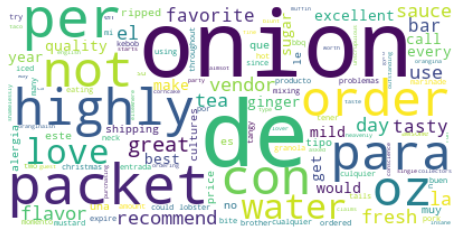

Number of reviews in cluster 0: 9540


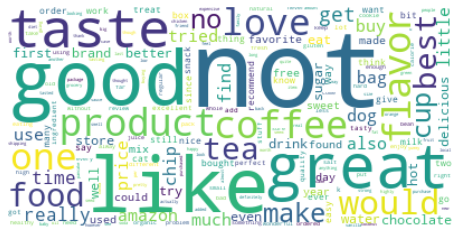

In [69]:
dbscanModeltfidfw2vLabels=dbscanModeltfidfw2v.labels_
printNumberOfWordsinCluster(dbscanModeltfidfw2vLabels, final['CleanedText'])

# [6] Conclusions

## 1. K-Means clustering 
### a. BoW
- We see from the plot of clusters vs log inertia plot that elobow point is around 5 clusters. Hence we choosen 5 cluster model
- Cluster formed by BoW data shows the appreaction of the products customer bought like coffee and their taste and flavour

### b. TFIDF
- We see from the plot of clusters vs log inertia plot that elobow point is around 5 clusters. Hence we choosen 5 cluster model
- Cluster formed by TFIDF data shows people talking about pet food and some products being not so good. Also, you can see mentions about snaks and ingredients

### c. Avg w2v
- We see from the plot of clusters vs log inertia plot that elobow point is around 5 clusters. Hence we choosen 5 cluster model
- Words cloud formed by Avg w2v words shows people talikng about Cats, dogs, tea, coffee, taste, ingrediants, products not beings good in various clusters

### d. TFIDF weighted w2v
- We see from the plot of clusters vs log inertia plot that elobow point is around 5 clusters. Hence we choosen 5 cluster model
- you see words describing flovaoured drink like soda, pet foods, snaks in 5 clusters formed by TFIDF weighted w2v words

## 2. Agglomerative clustering 

### a. Avg w2v
- Cluster size is choosen as 2
- In one cluster there's lot going on about beverages like coffee and tea and taste. Another cluster talks about price of the products and their ingredients
- Words cloud formed by Avg w2v words shows people talikng about Cats, dogs, tea, coffee, taste, ingrediants, products not beings good in various clusters

### b. TFIDF weighted w2v
- Clusters are of sizes 2 and 5
- Reviews related to dog and cat food, ingredient, beverages like coofe tea, products being tasty and flavourful


## 2. DBSCAN clustering

### a. Avg w2v
- A plot of epsilon values vs average distance between each point and its k nearest neighbors showed where elbow points are formed
- Accordingly, epsilon values like 0.15, 0.2 and 0.3 are choosen and formed clusters.
- A cluster named -1 shows all the outliers present
-  clusters formed shows people talking main about drinks like coffe tea, snaks and customer appreciation towards the price, flavour and taste 

### b. TFIDF weighted w2v
- epsilon values like 0.15, 0.2 and 0.3 are choosen according the elbow points and formed clusters
- clusters talk about various beverages like coffee, tea, the flovours, ingredients, cat and dog foos, price of products